# Multiscale Analisys of images

The goal of this laboratory is to analyze different schemes allowing a multiscale analysis where frequency components are progressively extracted from images. We will analyze in particular pyramidal decomposition and the wavelet transform. 


## 1 Lab configuration

As usual, let us first load the necessary packages for this laboratory. 

In [1]:
!pip install pillow==9.0.1 numpy==1.21.5 scikit-image==0.19.2 albumentations==1.1.0 imgaug==0.4.0 datascience==0.17.0 coveralls==3.3.1 matplotlib==3.5.1 pywavelets==1.2.0  plotly==5.6.0


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 29.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 50.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.0/14.0 MB 34.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.4/102.4 KB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.2/721.2 KB 26.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 65.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 53.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.7/27.7 MB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.9/226.9 KB 24.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.8/212.8 KB 20.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━

It may be useful to have an efficient way to transfer data from your google drive to colaboratory. This can be done by mounting your google drive in the colaboratory environment. 

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Let us copy the needed images for the lab. 

In [3]:
!wget "https://drive.google.com/uc?id=1TFLn46IKEp4rfRpE4cEZUKkaoGgG7C8Q" -O "lena.bmp"

--2023-03-16 09:17:58--  https://drive.google.com/uc?id=1TFLn46IKEp4rfRpE4cEZUKkaoGgG7C8Q
Resolving drive.google.com (drive.google.com)... 74.125.130.138, 74.125.130.113, 74.125.130.101, ...
Connecting to drive.google.com (drive.google.com)|74.125.130.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0c-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/vite8d6eansactlbg2tuavbnk4cun9hl/1678958250000/01169085275889637052/*/1TFLn46IKEp4rfRpE4cEZUKkaoGgG7C8Q?uuid=1d8a0206-38a8-4641-8c6e-8d35d682dafb [following]
--2023-03-16 09:17:58--  https://doc-0c-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/vite8d6eansactlbg2tuavbnk4cun9hl/1678958250000/01169085275889637052/*/1TFLn46IKEp4rfRpE4cEZUKkaoGgG7C8Q?uuid=1d8a0206-38a8-4641-8c6e-8d35d682dafb
Resolving doc-0c-64-docs.googleusercontent.com (doc-0c-64-docs.googleusercontent.com)... 74.125.200.132, 2404:6800:4003:c00::84
Connecting to doc-0c

### 1.1 Initialization

Let us import the necessary libraries and create some useful functions for visualization. 

In [4]:
import numpy as np

import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

import skimage.filters as skfi
import skimage.transform as sktf
import skimage.io as skio

import pywt 

import plotly.express as px
import plotly.graph_objects as go


def display_image(img_in, title='', size=None):
  img = img_in.astype(np.double)
  img = img - np.min(img)
  img = img / np.max(img)
  
  plt.gray()
  h = plt.imshow(img, interpolation='none')
  if size:
    dpi = h.figure.get_dpi()/size
    h.figure.set_figwidth(img.shape[1] / dpi)
    h.figure.set_figheight(img.shape[0] / dpi)
    h.figure.canvas.resize(img.shape[1] + 1, img.shape[0] + 1)
    h.axes.set_position([0, 0, 1, 1])
    h.axes.set_xlim(-1, img.shape[1])
    h.axes.set_ylim(img.shape[0], -1)
  plt.grid(False)
  plt.title(title)  
  plt.show()


def display_images(imgs, columns=None, rows=None, size=None, path=None, title=''):  

  C = len(imgs)
  
  if columns==None:
    columns = int(C/2)
    rows = 2

  pos  = range(1,columns*rows + 1)
  fig = plt.figure(1)
  fig.tight_layout()
  k=0
  for c in range(columns):
    for r in range(rows):
      img = imgs[k]
      ax = fig.add_subplot(rows,columns,pos[k])
      h = ax.imshow(img, interpolation='none')
      if size:
        dpi = h.figure.get_dpi()/size
        h.figure.set_figwidth(img.shape[1] / dpi)
        h.figure.set_figheight(img.shape[0] / dpi)
        h.figure.canvas.resize(img.shape[1] + 1, img.shape[0] + 1)
        #h.axes.set_position([0, 0, 1, 1])
        h.axes.set_xlim(-1, img.shape[1])
        h.axes.set_ylim(img.shape[0], -1)
  
      plt.grid(False)
      plt.axis('off')
      k = k+1

  #ax.figure.set_size_inches(6*columns*H/100, 6*rows*H/100)
  if path:
    plt.savefig(path)
    
  plt.show()

def display_ft(ft, title=''):
  N = ft.shape[0]
  x = np.linspace(-0.5, 0.5, N)
  y = np.linspace(-0.5, 0.5, N)
  X, Y = np.meshgrid(x, y)
  fig = go.Figure(data=[go.Surface(z=ft,x=X,y=Y)])
  fig.update_layout(title=title)
  fig.update_layout(scene = dict(xaxis_title='Fx', yaxis_title='Fy', zaxis_title='FT'))
  fig.show()

def display_dft(ft, title=''):
  fig = go.Figure(data=[go.Surface(z=ft)])
  fig.update_layout(title=title)
  fig.update_layout(scene = dict(xaxis_title='k', yaxis_title='l', zaxis_title='DFT'))
  fig.show()

def display_wavelet_dec(coeffs, size=1, title=''):

  arr, coeff_slices = pywt.coeffs_to_array(coeffs)

  arr_norm = arr

  # Normalize low band separately (for representation purposes)
  arr_norm[coeff_slices[0]] = arr_norm[coeff_slices[0]] - np.min(arr_norm[coeff_slices[0]])
  arr_norm[coeff_slices[0]] = (arr_norm[coeff_slices[0]] / (np.max(arr_norm[coeff_slices[0]]) + 1e-50))
  lb = arr_norm[coeff_slices[0]].copy()
  arr_norm[coeff_slices[0]] = 0

  # Normalize coeffs
  arr_norm = arr_norm - np.min(arr_norm)
  arr_norm = (arr_norm / (np.max(arr_norm) + 1e-50)) - 0.5
  arr_norm = arr_norm.clip(-0.1,0.1)*5 + 0.5 
  arr_norm[coeff_slices[0]] = lb

  display_image(arr_norm, size=size, title=title)


Select an image of your choice (from the internet or your personal photo collection). We are going to analyze its frequency content. So try to select an image that areas with different frequency content, that is some areas with low frequencies, others with high frequencies and others with intermediate frequencies. Also make sure you image size is reasonable and corresponds to a power of two either 512x512 or 1024x1024 (if necessary you may have to downsample your image).

Read it so that you can process it. For simplicity we want to work with gray scale images so make sure you use "as_gray=True" when reading it to colab and that you normalize them so gray values go from 0.0 to 1.0

In [5]:
# Read image
img = skio.imread('lena.bmp', as_gray=True)
# Resize to 256x256 (already converts to [0,1])
img = sktf.resize(img,(256,256))
# Make sure gray values go from [0,1]
#img = img.astype(np.double)/255

# Print max and min values
print('Minimum value = ', np.min(img), '; Maximum value = ', np.max(img))
print('img shape = ', img.shape)


Minimum value =  0.1087395215525759 ; Maximum value =  0.9154378535841902
img shape =  (256, 256)


## 2 Pyramidal multiscale analysis



Using Gaussian filters, a multiscale analysis of images can be obtained with the following scheme: 
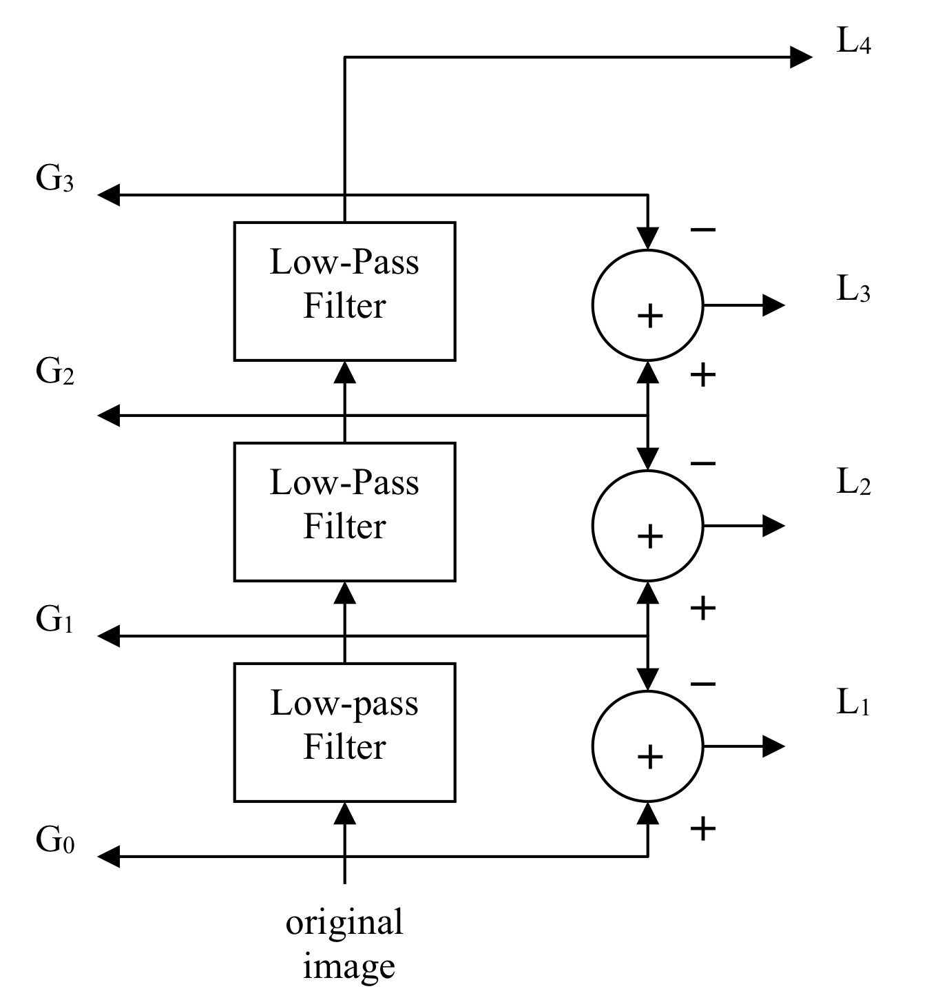

$G_n$ images are called 'gaussians' because they are usually obtained with Gaussian filters. $L_n$ images are called 'laplacians' because they frequency spectrum is the complement of a Gaussian. Note that they are not really obtained with laplacian filters. They are computed by a difference between Gaussians:

\begin{equation}
L_n = G_{n-1} - G_n \tag{1}
\end{equation}

From equation (1), one can easily show that:

\begin{equation}
G_0 = G_1 + L_1 = (G_2 + L_2) + L_1 = \cdots = L_N + L_{N-1} + \cdots + L_1 \tag{2}
\end{equation}

As can be seen, the original image can always be reconstructed from the set of $L_n$ images.

We will implement the decomposision defined by equation (1) using Gaussian filters. Let us review first how we can use Gaussian and Laplacian impulse responses to filter images.








### 2.1 Linear filters

Let us test filtering images with a low-pass (gaussian) and high-pass (laplacian) filters. First we generate the impulse response of a gaussian filter and visualize the frequency response:



In [6]:
def gaussian_kernel(size=5,sigma=1.0):
  a = np.zeros((size, size))
  a[int(np.floor(size/2)),int(np.floor(size/2))] = 1
  h = skfi.gaussian(a, sigma=sigma, mode='constant', cval=0)
  return h/np.sum(h)

# Define a gaussian kernel (size=5 and sigma=1)
h_gau = gaussian_kernel(size=5,sigma=1)
print(h_gau)

# Visualize its frequency response
N = 256
H_GAU = np.abs(np.fft.fftshift(np.fft.fft2(h_gau,(N,N))))
display_ft(H_GAU)

[[0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.02193823 0.09832033 0.16210282 0.09832033 0.02193823]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]]


And repeat the process for the laplacian filter:

In [7]:
def laplace_kernel(alpha=0.0):
  h = np.zeros((3, 3))
  h1    = alpha/(alpha+1); h2 = (1-alpha)/(alpha+1);
  h[0,:] = [h1,h2,h1]
  h[1,:] = [h2, -4/(alpha+1), h2]
  h[2,:] = [h1,h2,h1]
  return h

# Define a laplacian kernel
h_lap = laplace_kernel()
print(h_lap)

# Visualize its frequency response
N = 256
H_LAP = np.abs(np.fft.fftshift(np.fft.fft2(h_lap,(N,N))))
display_ft(H_LAP)


[[ 0.  1.  0.]
 [ 1. -4.  1.]
 [ 0.  1.  0.]]


To analyze the filtering results on the input image, we will use the convolution operator. Please note that the convolution of a sequence of length $L_1$ with another sequence of length $L_2$ creates e sequence of length $L_1 + L_2 - 1$. For example, the convolution of the input image of size $256x256$ with the impulse response h_gau of size $5x5$ creates an image of size $260x260$. But in many circumstances, we want the output image to be of the same size as the input image. In the command convolve2d(original_image, impulse_response, mode='same'), the parameter 'same' indicates that the output image has to be cut to have the same size as the original.


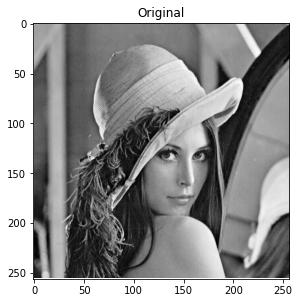

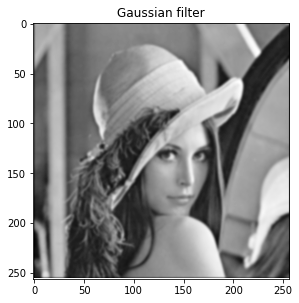

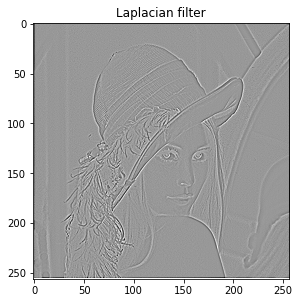

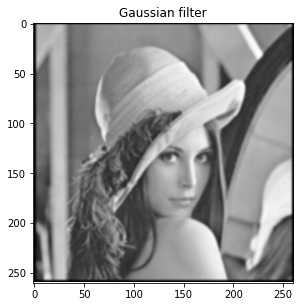

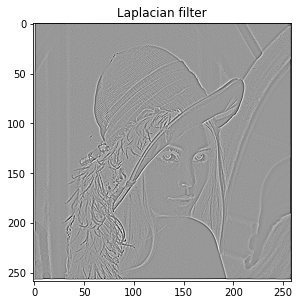

In [8]:
import scipy

img_gau = scipy.signal.convolve2d(img,h_gau,mode='same')
img_lap = scipy.signal.convolve2d(img,h_lap,mode='same')

img_gau2 = scipy.signal.convolve2d(img,h_gau)
img_lap2 = scipy.signal.convolve2d(img,h_lap)

display_image(img,size=1, title='Original')
display_image(img_gau,size=1, title='Gaussian filter')
display_image(img_lap,size=1, title='Laplacian filter')
display_image(img_gau2,size=1, title='Gaussian filter')
display_image(img_lap2,size=1, title='Laplacian filter')


What is the mean value of the filtered images? Note that the function "display_image()" normalizes the visualization of the image between its minimum (always black) and maximum (always white) values.

In [9]:
print('mean value original image = ', np.mean(img))
print('mean value gaussian filtered image = ', np.mean(img_gau))
print('mean value laplacian filtered image = ', np.mean(img_lap))
print('mean value gaussian filtered image without same parameter= ', np.mean(img_gau2))
print('mean value laplacian filtered image without same parameter= ', np.mean(img_lap2))

mean value original image =  0.4864722354971407
mean value gaussian filtered image =  0.48388691173278575
mean value laplacian filtered image =  -0.0073289278645779716
mean value gaussian filtered image without same parameter=  0.47161900037781984
mean value laplacian filtered image without same parameter=  -2.6352869102033343e-19


<font color='purple'>Q1. Comment and justify the visual content observed in the filtered images and the modification of the mean value of the images. How do these results about mean values change if you remove the ‘same’ parameter in the convolution. Try to relate the change of mean values to a specific feature of the frequency response or of the impulse response as well as the padding done outside the image to compute the convolution:</font>

---
<font color='red'>Q1. Answer: 

On the one hand, the Gaussian filter reduces the high-frequency components in the image, resulting in a smoother image with a slight blur (as it has a low-pass frequency response). On the other hand, the Laplacian filter enhances the high-frequency components, resulting in an image basically with the edges of the objects (high-pass frequency response).
We can appreciate that the mean value of the Gaussian filtered image is a little bit lower than the original, whereas the mean value obtained using the Laplacian filter is significantly lower. This is due to the fact that, as mentioned before, the Gaussian filter reduces the intensity of the high-frequency components, resulting in a lower mean value. In contrast, given the fact that the Laplacian filter enhances the high-frequency components, the result is a negative mean value.
If we remove the 'same' parameter, the mean value of the Gaussian filtered image decreases even further, and the mean value of the Laplacian filtered one becomes extremely small, nearly zero. This is because without the 'same' parameter, we are computing values for regions outside of the image by adding padding. As the padding has value zero, it's normal that the mean value decreases in such way.
Additionally, since the Laplacian filter is a second-order derivative filter, it is more sensitive to noise, which can cause the output mean value to be more affected. 
</font> 

High-pass filtering can also be achieved through a difference with a low-pass filter: 

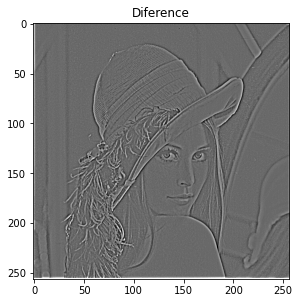

mean value difference image =  0.0025853237643549635


In [10]:
img_low = img_gau
img_high = img - img_low
display_image(img_high, size=1, title='Diference')
print('mean value difference image = ', np.mean(img_high))

In [11]:

delta = np.zeros((5, 5))
delta[2, 2] = 1
h_high=delta-h_gau
print(h_high)
H_HIGH = np.abs(np.fft.fftshift(np.fft.fft2(h_high,(N,N))))
display_ft(H_HIGH)


[[-0.00296902 -0.01330621 -0.02193823 -0.01330621 -0.00296902]
 [-0.01330621 -0.0596343  -0.09832033 -0.0596343  -0.01330621]
 [-0.02193823 -0.09832033  0.83789718 -0.09832033 -0.02193823]
 [-0.01330621 -0.0596343  -0.09832033 -0.0596343  -0.01330621]
 [-0.00296902 -0.01330621 -0.02193823 -0.01330621 -0.00296902]]


<font color='purple'>Q2. What is the equivalent impulse response of the filter? Can you compute it and visualize the corresponding filter frequency response? </font>

---
<font color='red'>Q2. Answer: 
The equivalent impulse response of the high-pass filter obtained as the difference between the input image and the Gaussian filtered image can be computed as:
$$h_{hp}(x,y) = \delta(x,y) - h_{gauss}(x,y)$$
Which in frequency results in:
$$H_{high}(F_{x},F_{y})=1-H_{gauss}(F_x,F_y)$$

The impulse response and the plot above prove that it is a high pass filter.
</font> 

The expression:
\begin{equation}
    img = img\_low + img\_high \tag{3}
\end{equation}

can be considered as a frequency decomposition of the original image. This equation is the core of the multiscale decomposition  studied in this section. 


### 2.2 Decomposition

Let us implement the decomposition defined by equation (1). We will use Gaussian filters as low-pass filters and define a structure with four levels as in the figure at the beginning of section 2. The result will be store in vector $g$ (with the four $G_0$, $G_1$, $G_2$ and $G_4$ images) and $l$ (with images $L_1$, $L_2$, $L_3$ and $L_4$):

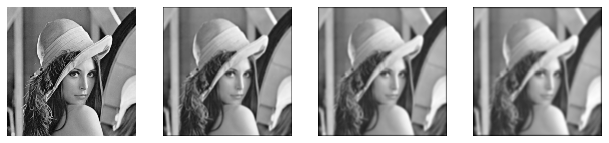

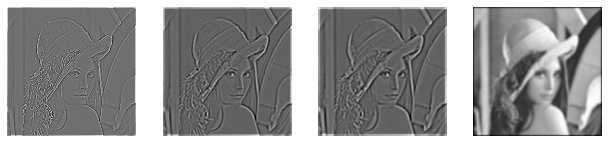

In [12]:
h = gaussian_kernel(size=5,sigma=1.5)
g = []
l = []
levels = 4

x = img
for i in range(levels):
  if i==0:
    g.append(x)
  else:
    x = scipy.signal.convolve2d(g[i-1],h,mode='same')
    g.append(x)
    l.append(g[i-1] - g[i])
l.append(g[i])

display_images(g,columns=4,rows=1,size=3)
display_images(l,columns=4,rows=1,size=3)

Let us compute that the reconstruction is correct:


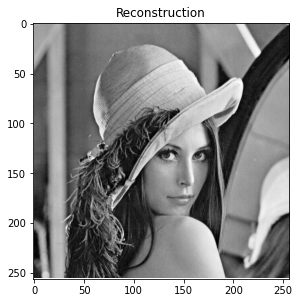

In [13]:
recons = l[3] + l[2] + l[1] + l[0]
display_image(recons,title='Reconstruction',size=1)

Finally, let us compte the reconstruction error (and the PSNR):


In [14]:
mse = np.mean(np.square(img - recons),axis=None)
psnr = -10*np.log10(mse+1e-100)
print('MSE = ', mse)
print('PSNR = ', psnr, 'dB')

MSE =  5.583598166405866e-38
PSNR =  372.53085844036764 dB


<font color='purple'>Q3. Report the value of the PSNR. Is it what was expected? (remember that a computer has a limited number of bits to represent real numbers. So, extremely small rounding errors may occur): </font>

---
<font color='red'>Q3. Answer: 
I see it as an extremely high number, but it is possible to obtain it as the MSE is also extremely small. This means that the reconstruction is almost perfect but in practice is highly unlikely to achive it.
</font> 

<font color='purple'>Q4. How can you explain that iterating the same filter, the resulting Gaussian images are increasingly low-pass?  Hint: use function convolve2d() and display_fft() to compute the frequency response of the filters (h_gau*h_gau) and (h_gau*h_gau*h_gaus) and compare them with h_gau. </font>

---
<font color='red'>Q4. Answer: 
When we apply a Gaussian filter multiple times, we are removing high frequencies from the image every time as the Gaussian filter is a low-pass filter.
In other words, applying gaussian filters consecutively is the same as increasing the kernel of the filter, so it computes the average of more pixels, smoothing more and more the image.
In the following plots we can see the removal of high frequencies. As we keep applying the filter, the spectrum of its convolutions becomes smaller and ignores the the high frequencies. in every iteration, the values of the filter becom smaller as they are multiplied (the ones on the tail of the gauss function decrease faster than the ones in the middle as it can be seen).

</font> 

In [15]:
display_ft(h_gau, title='h_gau')
h_gauh_gau = scipy.signal.convolve2d(h_gau, h_gau)
display_ft(h_gauh_gau, title='h_gau*h_gau')
h_gauh_gauh_gauh_gau = scipy.signal.convolve2d(h_gauh_gau, h_gau)
display_ft(h_gauh_gauh_gauh_gau, title='h_gau*h_gau*h_gau')

### 2.3 Subsampling

Subsampling the output of each Gaussian filter leads to the following scheme: 

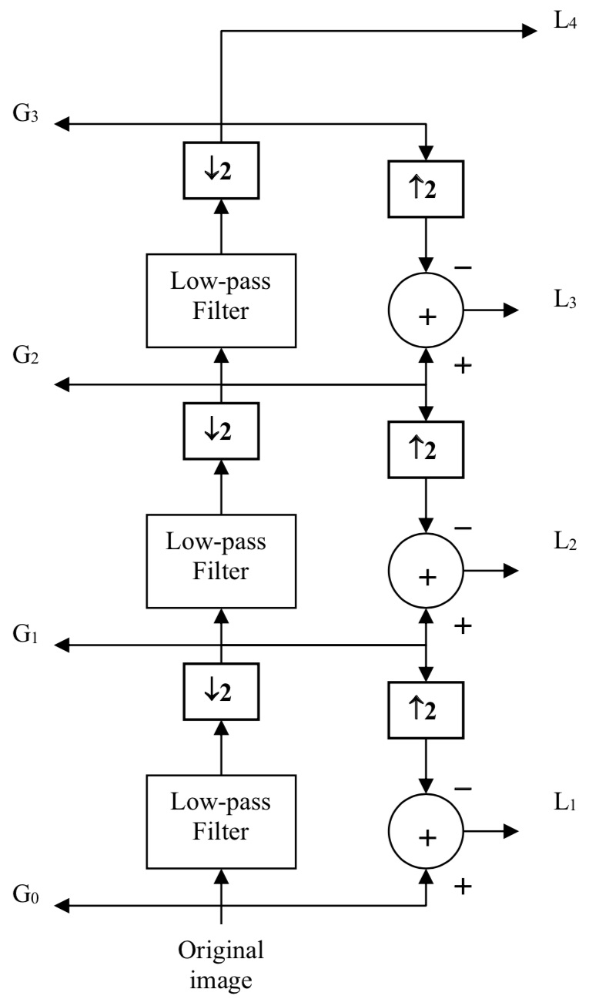

Let us analyze the scheme: The Gaussian images $G_n$ are now not only increasingly low-pass but also of smaller size ($512x512$, $256x256$, $128x128$ and $64x64$) because of the subsampling. This is the reason why this scheme is known as a pyramidal decomposition.

In order to compute the difference between $G_n$ and $G_{n-1}$ it is necessary to interpolate $G_n$. This interpolation is represented by the $\uparrow2$ symbol in the figure. The laplacian images $L_n$, as the Gaussian images are of decreasing size, creating a pyramid.

The interpolation process has to be taken into account for the reconstruction. From the picture above, it is easy to derive the following reconstruction process:
\begin{equation}
G_0 = interp(G_1) + L_1 = interp(interp(G_2) + L_2) + L_1 = \cdots
= interp(interp( \cdots interp(L_N) \cdots ) + L_2) + L_1 \tag{4}
\end{equation}

The following commands implement the pyramidal decomposition. We will use functions $pyramid\_reduce()$ and $pyramid\_expand$ from the $skimage.transform$ module to jointly perform the gaussian filtering + downsampling (in the case of $pyramid\_reduce()$) and upsampling + filtering (in the case of $pyramid\_expand()$):



In [16]:
from skimage.transform import pyramid_reduce, pyramid_expand

levels = 4

x = img
g = []
l = []
for i in range(levels):
  if i==0:
    g.append(x)
  else:
    cd = pyramid_reduce(g[i-1], channel_axis=None)
    cu = pyramid_expand(cd, channel_axis=None)
    g.append(cd)
    l.append(g[i-1] - cu)
l.append(g[i])

Let us visualize the complete decomposition, first the gaussian images $G_n$: 

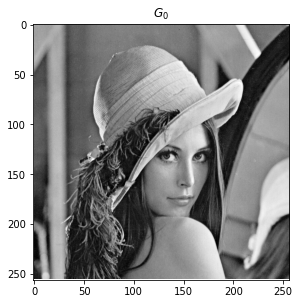

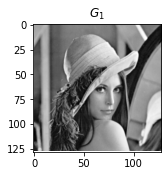

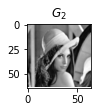

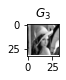

In [17]:
for i in range(levels):
  display_image(g[i],size=1,title='$G_{0:d}$'.format(i))

and then laplacian images $L_n$: 

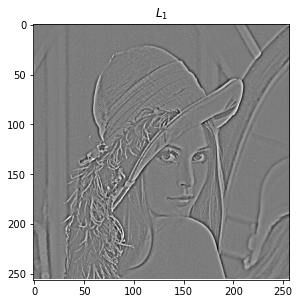

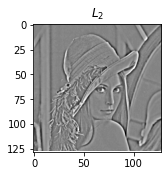

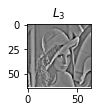

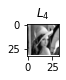

In [18]:
for i in range(levels):
  display_image(l[i],size=1,title='$L_{0:d}$'.format(i+1))

Let us perform the reconstruction process:

In [19]:
recons = []

for i in range(levels):
  if i==0:
    recons.append(l[levels-i-1])
  else:
    recons.append(pyramid_expand(recons[i-1]) + l[levels-i-1])


and visualize it:

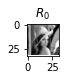

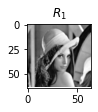

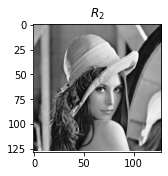

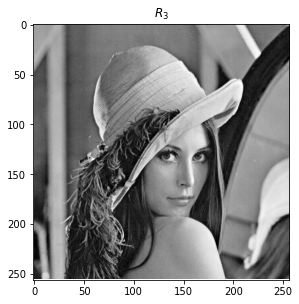

In [20]:
for i in range(levels):
  display_image(recons[i],size=1,title='$R_{0:d}$'.format(i))

Finally, let us compare the original and reconstructed images and compute the reconstruction error and the PSNR:

In [21]:
mse = np.mean(np.square(img - recons[-1]),axis=None)
psnr = -10*np.log10(mse+1e-100)
print('MSE = ', mse)
print('PSNR = ', psnr, 'dB')

MSE =  4.70197740328915e-37
PSNR =  363.2771946233367 dB


The pyramidal decomposition has been used succesfully for different image processing algorithms since the early 80s. The main drawback of the pyramidal decomposition for compression is the number of generated pixels. In the limit, an image of size $NxN$ pixels is decomposed in: 
\begin{equation}
NxN + \frac{NxN}{4} + \frac{NxN}{16} + \frac{NxN}{64} + \cdots= NxN (\sum \frac{1}{4^n}) = \frac{4}{3} NxN = 1,333 NxN pixels
\end{equation} 

The wavelet decomposition also generates a multiscale decomposition of images but it does not imply any increase in the number of pixels in the transformation. This is what we are going to study in the next section. 

## 3 Multiscale analysis with wavelet




### 3.1 Wavelets families

The discrete wavelet decomposition can be computed with an iterated filter bank: 

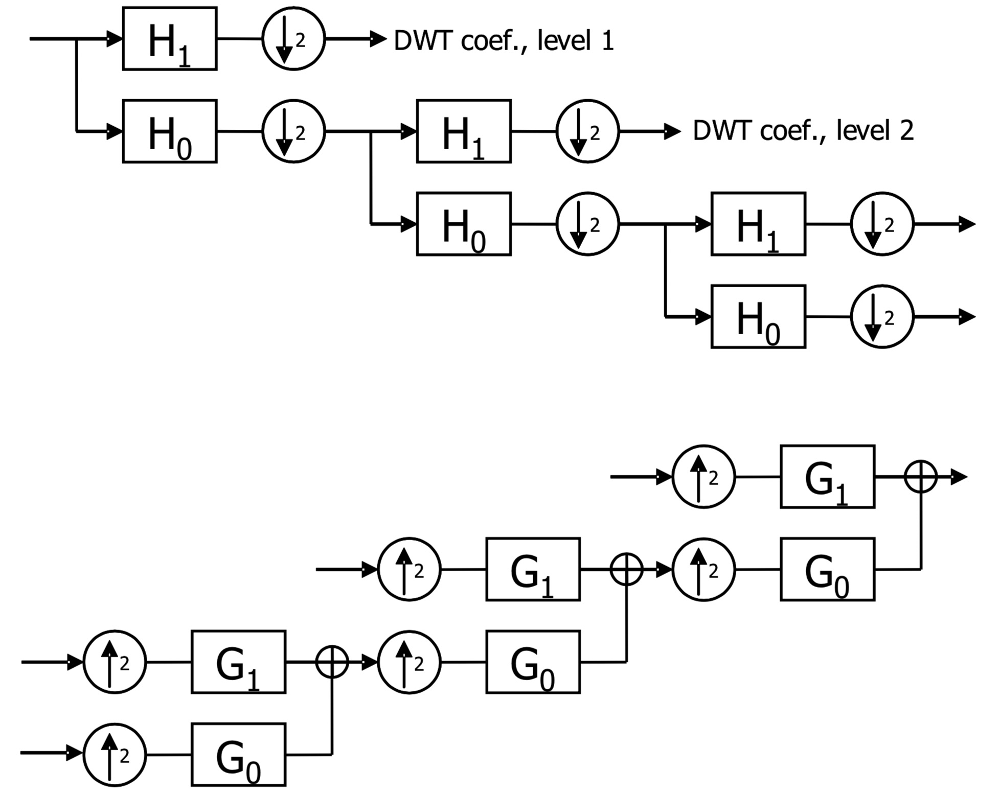

$H_0$ and $H_1$ are the analysis low-pass and high-pass filters whereas $G_0$ and $G_1$ are the synthesis low-pass and high-pass filters. We will use the python library pywavelets to generate the impulse response of these filters. 

We will start creating the filters for the Haar decomposition:


In [22]:
import pywt

filter_names = ['h0', 'h1', 'g0', 'g1']

def get_wavelet_filters(type):
  wavelet = pywt.Wavelet(type)
  filters = {}
  filters['h0'] = wavelet.dec_lo
  filters['h1'] = wavelet.dec_hi
  filters['g0'] = wavelet.rec_lo
  filters['g1'] = wavelet.rec_hi
  return filters,wavelet

def display_wavelet_filters_time(filters,filter_names):
  fig, axs = plt.subplots(2,2, gridspec_kw={'hspace': 0.4})
  for i in range(4):
    y = filters[filter_names[i]]
    x = np.arange(len(y))
    axs.flat[i].stem(x, y, use_line_collection=True)
    axs.flat[i].grid()
    axs.flat[i].set_title(filter_names[i] + '[n]')
    fig.show()

def display_wavelet_filters_freq(filters,filter_names,N):
  fig, axs = plt.subplots(2,2, gridspec_kw={'hspace': 0.4})
  for i in range(4):
    y = filters[filter_names[i]]
    Y = np.abs(np.fft.fftshift(np.fft.fft(y,n=N)))
    X = np.arange(N)/N - 0.5
    axs.flat[i].plot(X,Y)
    axs.flat[i].autoscale(enable=True, axis='x', tight=True)
    axs.flat[i].set_title('|' + filter_names[i].upper() + '(F)|')
    axs.flat[i].grid()
    fig.show()


filters_haar = get_wavelet_filters('haar')[0]

Let us visualize the impulse response of the filters:

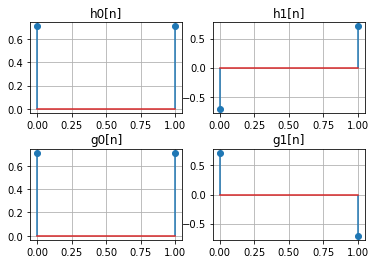

In [23]:
display_wavelet_filters_time(filters_haar,filter_names)

and the frequency response:

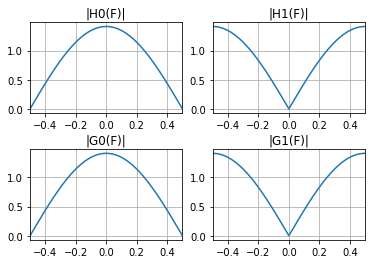

In [24]:
display_wavelet_filters_freq(filters_haar,filter_names,1024)

The synthesis filters are related to the analysis filters by the equation: $g_i[n] = h_i[L-1-n]$ (being $L$ the size in samples of the impulse response). The filters have linear phase and the high-pass filters are a modulated version of the low-pass filters.

We can check the orthogonality of the filter bank by comparing $h_0[n]$ ($h_1[n]$) and the time reversed version of $g_0[n]$ ($g_1[n]$). 

Moreover, the **symmetry in the impulse response** indicates that the filters have **linear phase**. 

In [25]:
# Compare h0[n] and g0[n]
print(filters_haar['h0'])
print(filters_haar['g0'])
print(filters_haar['h0'] - np.flip(filters_haar['g0']))

# Compare h1[n] and g1[n]
print(filters_haar['h1'])
print(filters_haar['g1'])
print(filters_haar['h1'] - np.flip(filters_haar['g1']))

[0.7071067811865476, 0.7071067811865476]
[0.7071067811865476, 0.7071067811865476]
[0. 0.]
[-0.7071067811865476, 0.7071067811865476]
[0.7071067811865476, -0.7071067811865476]
[0. 0.]


Let us repite the process but this time with Daubechies filters of length 6:

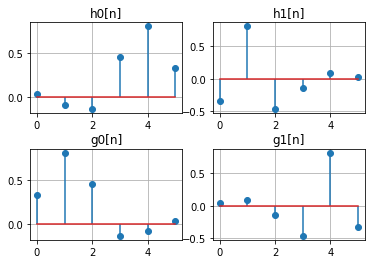

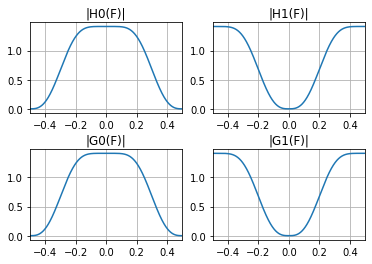

In [26]:
filters_db = get_wavelet_filters('db3')[0]
display_wavelet_filters_time(filters_db,filter_names)
display_wavelet_filters_freq(filters_db,filter_names,1024)

We can analyze the orthogonality:

In [27]:
# Compare h0[n] and g0[n]
print(filters_db['h0'])
print(filters_db['g0'])
print(filters_db['h0'] - np.flip(filters_db['g0']))

# Compare h1[n] and g1[n]
print(filters_db['h1'])
print(filters_db['g1'])
print(filters_db['h1'] - np.flip(filters_db['g1']))

[0.03522629188570953, -0.08544127388202666, -0.13501102001025458, 0.45987750211849154, 0.8068915093110925, 0.33267055295008263]
[0.33267055295008263, 0.8068915093110925, 0.45987750211849154, -0.13501102001025458, -0.08544127388202666, 0.03522629188570953]
[0. 0. 0. 0. 0. 0.]
[-0.33267055295008263, 0.8068915093110925, -0.45987750211849154, -0.13501102001025458, 0.08544127388202666, 0.03522629188570953]
[0.03522629188570953, 0.08544127388202666, -0.13501102001025458, -0.45987750211849154, 0.8068915093110925, -0.33267055295008263]
[0. 0. 0. 0. 0. 0.]


<font color='purple'>Q5. Are the Daubechies filters of length 6 orthogonal? Have they got a linear phase?</font>

---
<font color='red'>Q5. Answer: 
We can assure that the filters are orthogonal as g[n]=h[-n].  
Looking at the impulse response of the filters, it is obvious that thet have no symmetry so they do not have linear phase.
</font> 

Let us analyze now the case of biorthogonal filters:

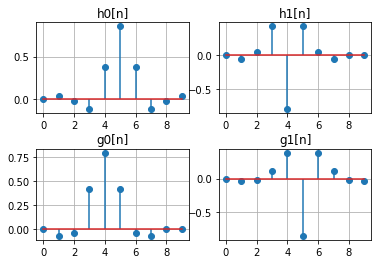

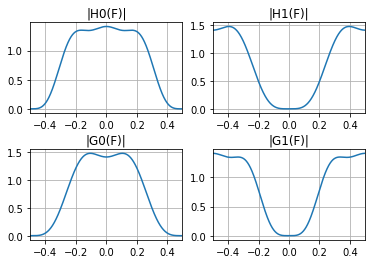

In [28]:
filters_bior = get_wavelet_filters('bior4.4')[0]
display_wavelet_filters_time(filters_bior,filter_names)
display_wavelet_filters_freq(filters_bior,filter_names,1024)

For the orthogonality, we can compare:

In [29]:
# Compare h0[n] and g0[n]
print(filters_bior['h0'])
print(filters_bior['g0'])
print(filters_bior['h0'] - np.flip(filters_bior['g0']))

# Compare h1[n] and g1[n]
print(filters_bior['h1'])
print(filters_bior['g1'])
print(filters_bior['h1'] - np.flip(filters_bior['g1']))

[0.0, 0.03782845550726404, -0.023849465019556843, -0.11062440441843718, 0.37740285561283066, 0.8526986790088938, 0.37740285561283066, -0.11062440441843718, -0.023849465019556843, 0.03782845550726404]
[0.0, -0.06453888262869706, -0.04068941760916406, 0.41809227322161724, 0.7884856164055829, 0.41809227322161724, -0.04068941760916406, -0.06453888262869706, 0.0, 0.0]
[ 0.          0.03782846  0.04068942 -0.06993499 -0.04068942  0.06421306
 -0.04068942 -0.06993499  0.04068942  0.03782846]
[-0.0, -0.06453888262869706, 0.04068941760916406, 0.41809227322161724, -0.7884856164055829, 0.41809227322161724, 0.04068941760916406, -0.06453888262869706, -0.0, 0.0]
[0.0, -0.03782845550726404, -0.023849465019556843, 0.11062440441843718, 0.37740285561283066, -0.8526986790088938, 0.37740285561283066, 0.11062440441843718, -0.023849465019556843, -0.03782845550726404]
[ 0.03782846 -0.04068942 -0.06993499  0.04068942  0.06421306  0.04068942
 -0.06993499 -0.04068942  0.03782846  0.        ]


<font color='purple'>Q6. Are the filters orthogonal? Have they got a linear phase?</font>

---
<font color='red'>Q6. Answer: 
The biorthogonal filters have linear phase given their symmetry but they are not orthogonal as g[-n]!=h[n].
</font> 

### 3.2 Wavelet decomposition

The wavelet decomposition is computed by an iterated filter bank. To process images, we first apply a horizontal filter bank and then a vertical filter bank: 

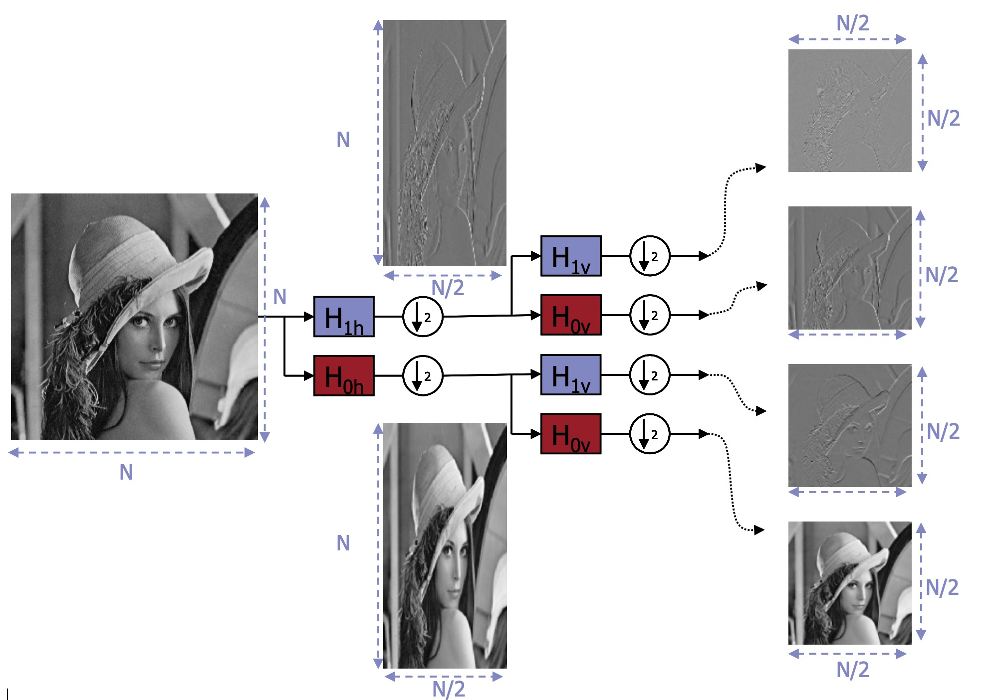

Compute the 'Haar' wavelet decomposition with four levels. We will use function wavedec2() from pywavelets module to compute the entire 2D decomposition:

In [30]:
levels = 4
coeffs_haar = pywt.wavedec2(img, 'haar',level=levels, mode='periodization')

And we will display the decomposition (normalizing the low pass band separately to better visualize the coefficients)

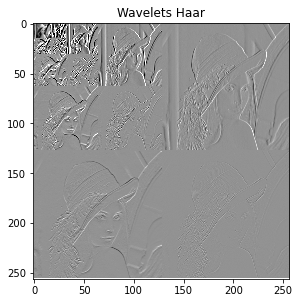

In [31]:
display_wavelet_dec(coeffs_haar,title='Wavelets Haar')

Let us compute that the reconstruction is correct:

MSE =  3.411863184405753e-31
PSNR =  304.6700839234887 dB


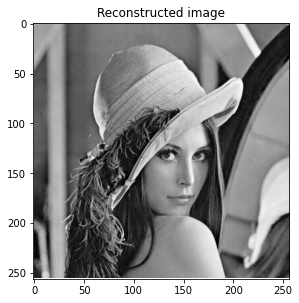

In [32]:
recons = pywt.waverec2(coeffs_haar,'haar', mode='periodization')
mse = np.mean(np.square(img - recons),axis=None)
psnr = -10*np.log10(mse+1e-100)
print('MSE = ', mse)
print('PSNR = ', psnr, 'dB')
display_image(recons,size=1,title='Reconstructed image')

Let us now compare the Haar decomposition result with the one obtained with biorthogonal filters:

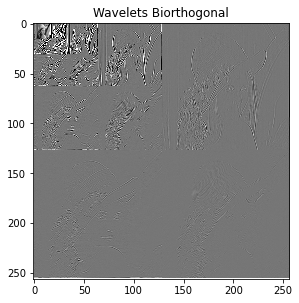

In [33]:
levels = 4
coeffs_bior = pywt.wavedec2(img, 'bior4.4',level=levels, mode='periodization')
display_wavelet_dec(coeffs_bior,title='Wavelets Biorthogonal')

<font color='purple'>Q7. Is the Haar decomposition better or worse than the biorthogonal one? </font>

---
<font color='red'>Q7. Answer: 
The Haar decomposition only captures the contours of the image (although it does so very well because it is linear and orthogonal) but the biorthogonal decomposition contains more information. Apart from the contours, we can see changes in pixel values, such as in the feathers of a hat, although the contours are not as well defined as in the Haar decomposition (because biorthogonal wavelets are not orthogonal)
</font> 

## 4 Image compression

### 4.1 Image compression with wavelets

In this section, a quantization / entropy coding approach known as SPIHT ("Set Partitioning In Hierarchical Trees") will be used. The JPEG2000 standard is using a similar technique to compress the information after the wavelet decomposition. 

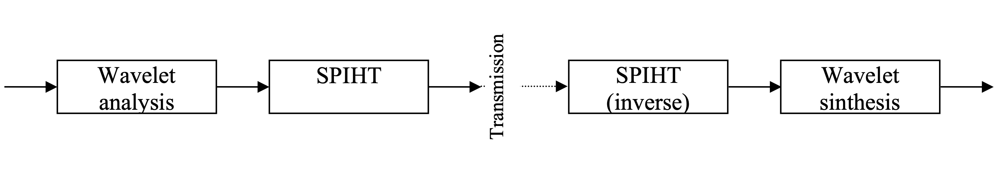

The SPIHT algorithm creates a bitstream ordering the information in such a way that the bits corresponding to the most important wavelet coefficients are at the beginning of the bitstream, whereas less important information appears at the end of the bitstream. Furthermore, the coefficients information is organized by bit planes: the most significant bits are transmitted first and the coefficient accuracy is progressively improved with less significant bits. Moreover, the SPIHT algorithm orders the coefficients as a function of their magnitude. Coefficients of high (low) magnitude are considered as more (less) important and will appear at the beginning (end) of the bitstream. Finally, "inter-scale" correlation is used: for example, the presence of a zero coefficient in a band at a given scale indicates that there is a high probability that the coefficients of the same band but at lower scales are also equal to zero. 


These configurations are known as zerotrees and are coded with a specific and unique symbol by the SPIHT. 

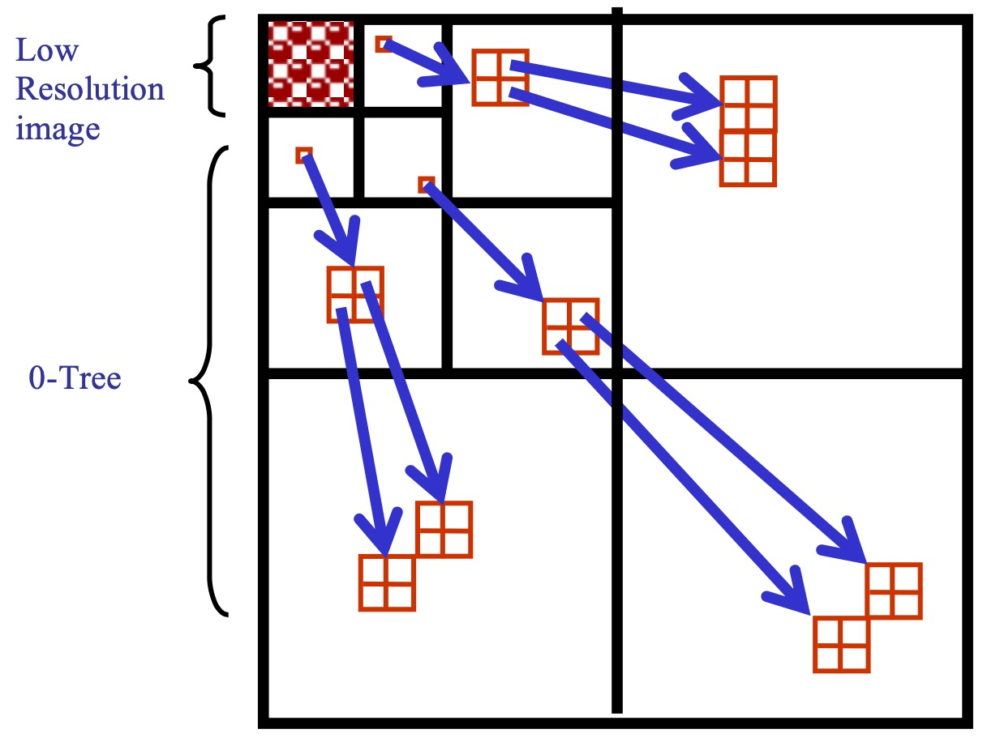


As a result of this information ordering process, the bistream is scalable: the compression factor can be chosen by simply cutting the bitstream at any point and we are sure to get the best possible representation (in the Mean Square Error sense) for this given number of bits.  

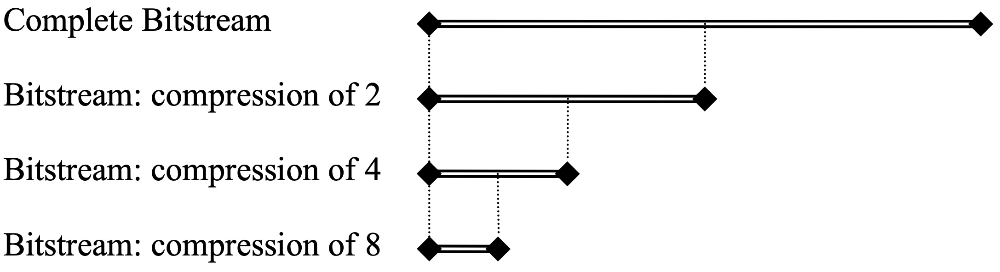

Execute the following code that contain the SPIHT implementation in python (You do NOT need to follow and understand this code, just the general concept of the algorithm explained above):

In [34]:
import functools
import operator
import numpy as np


def spiht_bitget(number, pos):
    return (number >> pos) & 1

def spiht_descendant(i, j, type, m):

    s = m.shape[0]
    S = []

    index = 0
    a = 0
    b = 0

    while 2*i < s and 2*j < s :

        a = i
        b = j

        mind = np.arange(2 * (a + 1) - 2, 2 * (a + np.exp2(index).astype(int)))
        nind = np.arange(2 * (b + 1) - 2, 2 * (b + np.exp2(index).astype(int)))

        # Check ranges
        mind = mind[mind<s]
        nind = nind[nind<s]

        S.append(m[np.ix_(mind,nind)].flatten())

        index = index + 1
        i = 2 * a
        j = 2 * b

    S2 = functools.reduce(operator.iconcat, S, [])

    if type == 1:
        S2 = np.delete(S2,np.arange(0,4),axis=0)

    r = np.abs(np.array(S2))

    r = np.max(r)

    return r


def spiht_encode(m, max_bits, level):

    block_size = m.size

    # Initialization
    bitctr = 0
    out = 2 * np.ones(max_bits - 14,int)
    n_max = np.floor(np.log2(np.abs(np.max(m))))
    Bits_Header = 0
    Bits_LSP = 0
    Bits_LIP = 0
    Bits_LIS = 0

    #   output bit stream header
    # image size, number of bit plane, wavelet decomposition level should be
    # written as bit stream header.
    out[0:3] = [m.shape[0], n_max, level]
    bitctr = bitctr + 24
    index = 3
    Bits_Header = Bits_Header + 24

    # Initialize LIP, LSP, LIS
    temp = []
    bandsize = np.exp2(np.log2(m.shape[0]) - level + 1).astype(int)

    temp1 = np.arange(bandsize)
    temp = np.tile(temp1, (bandsize, 1)).transpose()

    LIP = np.zeros((temp.size, 2), int)
    LIP[:, 0] = temp.flatten()
    LIP[:, 1] = temp.transpose().flatten()

    LIS = np.zeros((temp.size, 3), int)
    LIS[:, 0] = LIP[:, 0]
    LIS[:, 1] = LIP[:, 1]
    LIS[:, 2] = np.zeros(len(LIP[:, 0]))

    LSP = []

    pstart = 0
    pend = bandsize // 2
    for i in range(bandsize // 2):
        LIS = np.delete(LIS, np.array(range(pstart, pend)), axis=0)
        pdel = pend - pstart;
        pstart = pstart + bandsize - pdel
        pend = pend + bandsize - pdel

    n = n_max;

    #  coding
    while bitctr < max_bits:

        # Sorting Pass
        LIPtemp = LIP
        temp = 0

        for i in range(LIPtemp.shape[0]):

            if (bitctr + 1) >= max_bits:
                if (bitctr < max_bits):
                    out = np.delete(out, -1)
                return out

            if np.abs(m[LIPtemp[i, 0], LIPtemp[i, 1]]) >= np.exp2(n):  # 1: positive; 0: negative
                out[index] = 1
                bitctr = bitctr + 1
                index = index + 1
                Bits_LIP = Bits_LIP + 1
                sgn = m[LIPtemp[i, 0], LIPtemp[i, 1]] >= 0
                out[index] = sgn
                bitctr = bitctr + 1
                index = index + 1
                Bits_LIP = Bits_LIP + 1

                LSP.append(LIPtemp[i, :].tolist())
                LIP = np.delete(LIP, temp, axis=0)
                temp = temp - 1
            else:
                out[index] = 0
                bitctr = bitctr + 1
                index = index + 1
                Bits_LIP = Bits_LIP + 1

            temp = temp + 1

        LIStemp = LIS
        temp = 0
        i = 0
        while i < LIStemp.shape[0]:

            if LIStemp[i,2] == 0:
                if bitctr >= max_bits:
                    return out
                max_d = spiht_descendant(LIStemp[i,0], LIStemp[i,1], LIStemp[i,2], m)

                if max_d >= np.exp2(n):
                    out[index] = 1
                    bitctr = bitctr + 1
                    index = index + 1
                    Bits_LIS = Bits_LIS + 1
                    x = LIStemp[i,0]
                    y = LIStemp[i,1]

                    if (bitctr + 1) >= max_bits:
                        if bitctr < max_bits:
                            out = np.delete(out, -1)
                        return out

                    if np.abs(m[2*x,2*y]) >= np.exp2(n):
                        LSP.append([2*x,2*y])
                        out[index] = 1
                        bitctr = bitctr + 1
                        index = index + 1
                        Bits_LIS = Bits_LIS + 1
                        sgn = m[2*x,2*y] >= 0
                        out[index] = sgn
                        bitctr = bitctr + 1
                        index = index + 1
                        Bits_LIS = Bits_LIS + 1
                    else:
                        out[index] = 0
                        bitctr = bitctr + 1
                        index = index + 1
                        Bits_LIS = Bits_LIS + 1
                        LIP = np.vstack((LIP,[2*x,2*y]))

                    if (bitctr + 1) >= max_bits:
                        if bitctr < max_bits :
                            out = np.delete(out, -1)
                        return out

                    if np.abs(m[2*x,2*y + 1]) >= np.exp2(n):
                        LSP.append([2*x, 2*y + 1])
                        out[index] = 1
                        bitctr = bitctr + 1
                        index = index + 1
                        Bits_LIS = Bits_LIS + 1
                        sgn = m[2*x,2*y + 1] >= 0
                        out[index] = sgn
                        bitctr = bitctr + 1
                        index = index + 1
                        Bits_LIS = Bits_LIS + 1
                    else:
                        out[index] = 0
                        bitctr = bitctr + 1
                        index = index + 1
                        Bits_LIS = Bits_LIS + 1
                        LIP = np.vstack((LIP,[2*x,2*y + 1]))

                    if (bitctr + 1) >= max_bits:
                        if bitctr < max_bits:
                            out = np.delete(out, -1)
                        return out

                    if np.abs(m[2*x + 1, 2*y]) >= np.exp2(n):
                        LSP.append([2*x + 1, 2*y])
                        out[index] = 1
                        bitctr = bitctr + 1
                        index = index + 1
                        Bits_LIS = Bits_LIS + 1
                        sgn = m[2*x + 1, 2*y] >= 0
                        out[index] = sgn
                        bitctr = bitctr + 1
                        index = index + 1
                        Bits_LIS = Bits_LIS + 1
                    else:
                        out[index] = 0
                        bitctr = bitctr + 1
                        index = index + 1
                        Bits_LIS = Bits_LIS + 1
                        LIP = np.vstack((LIP, [2*x + 1, 2*y]))

                    if (bitctr + 1) >= max_bits:
                        if bitctr < max_bits:
                            out = np.delete(out, -1)
                        return out

                    if np.abs(m[2*x + 1, 2*y + 1]) >= np.exp2(n):
                        LSP.append([2*x + 1, 2*y + 1])
                        out[index] = 1
                        bitctr = bitctr + 1
                        index = index + 1
                        Bits_LIS = Bits_LIS + 1
                        sgn = m[2*x + 1,2*y + 1] >= 0
                        out[index]= sgn
                        bitctr = bitctr + 1
                        index = index + 1
                        Bits_LIS = Bits_LIS + 1
                    else:
                        out[index] = 0
                        bitctr = bitctr + 1
                        index = index + 1
                        Bits_LIS = Bits_LIS + 1
                        LIP = np.vstack((LIP, [2*x + 1, 2*y + 1]))

                    if (4*x+2 < m.shape[0]) and (4*y+2 < m.shape[1]):
                        LIS = np.vstack((LIS, [LIStemp[i,0],LIStemp[i,1],1]))
                        LIStemp = np.vstack((LIStemp, [LIStemp[i, 0], LIStemp[i, 1], 1]))
                    LIS = np.delete(LIS, temp, axis=0)
                    temp = temp - 1

                else:
                    out[index] = 0
                    bitctr = bitctr + 1
                    index = index + 1
                    Bits_LIS = Bits_LIS + 1

            else:
                if bitctr >= max_bits:
                    return out

                max_d = spiht_descendant(LIStemp[i,0], LIStemp[i,1], LIStemp[i,2], m)

                if max_d >= np.exp2(n):
                    out[index] = 1
                    bitctr = bitctr + 1
                    index = index + 1
                    x = LIStemp[i,0]
                    y = LIStemp[i,1]
                    LIS = np.vstack((LIS,[2*x    , 2*y    , 0]))
                    LIS = np.vstack((LIS,[2*x    , 2*y + 1, 0]))
                    LIS = np.vstack((LIS,[2*x + 1, 2*y    , 0]))
                    LIS = np.vstack((LIS,[2*x + 1, 2*y + 1, 0]))
                    LIStemp = np.vstack((LIStemp,[2*x    , 2*y    , 0]))
                    LIStemp = np.vstack((LIStemp,[2*x    , 2*y + 1, 0]))
                    LIStemp = np.vstack((LIStemp,[2*x + 1, 2*y    , 0]))
                    LIStemp = np.vstack((LIStemp,[2*x + 1, 2*y + 1,0]))
                    LIS = np.delete(LIS, temp, axis=0)
                    temp = temp - 1
                else:
                    out[index] = 0
                    bitctr = bitctr + 1
                    index = index + 1
                    Bits_LIS = Bits_LIS + 1

            i = i + 1
            temp = temp + 1

        # Refinement Pass
        temp = 0
        value = np.floor(np.abs(np.exp2(n_max - n + 1) * m[LSP[temp][0],LSP[temp][1]])).astype(int)

        while (value >= np.exp2(n_max + 2) and (temp < len(LSP))):

            if bitctr >= max_bits:
                return out

            s = spiht_bitget(value, int(n_max + 1))
            out[index] = s
            bitctr = bitctr + 1
            index = index + 1
            Bits_LSP = Bits_LSP + 1
            temp = temp + 1
            if temp < len(LSP):
                value = np.floor(np.abs(np.exp2(n_max - n + 1) * m[LSP[temp][0],LSP[temp][1]])).astype(int)

        n = n - 1

    return out



def spiht_decode(bits):

    # Initialization
    m = np.zeros((bits[0],bits[0]),np.double)
    n_max = bits[1]
    level = bits[2]
    ctr = 3

    # Initialize LIP, LSP, LIS
    temp = []
    bandsize = np.exp2(np.log2(bits[0]) - level + 1).astype(int)

    temp1 = np.arange(bandsize)
    temp = np.tile(temp1, (bandsize, 1)).transpose()

    LIP = np.zeros((temp.size, 2), int)
    LIP[:, 0] = temp.flatten()
    LIP[:, 1] = temp.transpose().flatten()

    LIS = np.zeros((temp.size, 3), int)
    LIS[:, 0] = LIP[:, 0]
    LIS[:, 1] = LIP[:, 1]
    LIS[:, 2] = np.zeros(len(LIP[:, 0]))

    LSP = []

    pstart = 0
    pend = bandsize // 2
    for i in range(bandsize // 2):
        LIS = np.delete(LIS, np.array(range(pstart, pend)), axis=0)
        pdel = pend - pstart;
        pstart = pstart + bandsize - pdel
        pend = pend + bandsize - pdel

    #  coding
    n = n_max

    while ctr < bits.shape[0]:

        # Sorting Pass
        LIPtemp = LIP
        temp = 0

        for i in range(LIPtemp.shape[0]):

            if ctr >= bits.shape[0] - 1: # addtl cond., prevents counter overflow
                return m

            if bits[ctr] == 1:
                ctr = ctr + 1
                if bits[ctr] > 0:
                    m[LIPtemp[i,0], LIPtemp[i,1]] = np.exp2(n) + np.exp2(n - 1)
                else:
                    m[LIPtemp[i,0], LIPtemp[i,1]] = -1*np.exp2(n) - np.exp2(n - 1)

                LSP.append(LIPtemp[i, :].tolist())
                LIP = np.delete(LIP, temp, axis=0)
                temp = temp - 1

            ctr = ctr + 1
            temp = temp + 1


        LIStemp = LIS
        temp = 0
        i = 0
        while i < LIStemp.shape[0]:

            if ctr >= bits.shape[0]:
                return m

            if LIStemp[i,2] == 0:

                if bits[ctr] == 1:
                    ctr = ctr + 1
                    x = LIStemp[i,0]
                    y = LIStemp[i,1]

                    if ctr >= bits.shape[0] - 1:  # addtl cond., prevents counter overflow
                        return m

                    if bits[ctr] == 1:
                        LSP.append([2*x,2*y])
                        ctr = ctr + 1
                        if bits[ctr] == 1:
                            m[2*x, 2*y] = np.exp2(n) + np.exp2(n - 1)
                        else:
                            m[2*x, 2*y] = -1*np.exp2(n) - np.exp2(n - 1);
                        ctr = ctr + 1
                    else:
                        LIP = np.vstack((LIP,[2*x,2*y]))
                        ctr = ctr + 1

                    if ctr >= bits.shape[0] - 1:  # addtl cond., prevents counter overflow
                        return m

                    if bits[ctr] == 1:
                        ctr = ctr + 1
                        LSP.append([2*x, 2*y + 1])
                        if bits[ctr] == 1:
                            m[2*x, 2*y+1] = np.exp2(n) + np.exp2(n - 1)
                        else:
                            m[2*x, 2*y+1] = -1*np.exp2(n) - np.exp2(n - 1)
                        ctr = ctr + 1
                    else:
                        LIP = np.vstack((LIP,[2*x, 2*y + 1]))
                        ctr = ctr + 1

                    if ctr >= bits.shape[0] - 1:  # addtl cond., prevents counter overflow
                        return m

                    if bits[ctr] == 1:
                        ctr = ctr + 1
                        LSP.append([2*x + 1, 2*y])
                        if bits[ctr] == 1:
                            m[2*x + 1, 2*y] = np.exp2(n) + np.exp2(n - 1)
                        else:
                            m[2*x + 1, 2*y] = -1*np.exp2(n) - np.exp2(n - 1)
                        ctr = ctr + 1
                    else:
                        LIP = np.vstack((LIP,[2*x + 1, 2*y]))
                        ctr = ctr + 1

                    if ctr >= bits.shape[0] - 1:  # addtl cond., prevents counter overflow
                        return m

                    if bits[ctr] == 1:
                        ctr = ctr + 1
                        LSP.append([2*x + 1, 2*y + 1])
                        if bits[ctr] == 1:
                            m[2*x + 1, 2*y + 1] = np.exp2(n) + np.exp2(n-1)
                        else:
                            m[2*x + 1, 2*y + 1] = -1*np.exp2(n)  - np.exp2(n-1)
                        ctr = ctr + 1
                    else:
                        LIP = np.vstack((LIP,[2*x + 1, 2*y + 1]))
                        ctr = ctr + 1

                    if (4*x+2 < m.shape[0]) and (4*y+2 < m.shape[1]):
                        LIS = np.vstack((LIS, [LIStemp[i,0],LIStemp[i,1],1]))
                        LIStemp = np.vstack((LIStemp, [LIStemp[i, 0], LIStemp[i, 1], 1]))
                    LIS = np.delete(LIS, temp, axis=0)
                    temp = temp - 1

                else:
                    ctr = ctr + 1

            else:
                if bits[ctr] == 1:

                    x = LIStemp[i,0]
                    y = LIStemp[i,1]
                    LIS = np.vstack((LIS,[2*x    , 2*y    , 0]))
                    LIS = np.vstack((LIS,[2*x    , 2*y + 1, 0]))
                    LIS = np.vstack((LIS,[2*x + 1, 2*y    , 0]))
                    LIS = np.vstack((LIS,[2*x + 1, 2*y + 1, 0]))
                    LIStemp = np.vstack((LIStemp,[2*x    , 2*y    , 0]))
                    LIStemp = np.vstack((LIStemp,[2*x    , 2*y + 1, 0]))
                    LIStemp = np.vstack((LIStemp,[2*x + 1, 2*y    , 0]))
                    LIStemp = np.vstack((LIStemp,[2*x + 1, 2*y + 1,0]))
                    LIS = np.delete(LIS, temp, axis=0)
                    temp = temp - 1

                ctr = ctr + 1

            i = i + 1
            temp = temp + 1

        # Refinement Pass
        temp = 0
        value = m[LSP[temp][0], LSP[temp][1]]

        while (np.abs(value) >= np.exp2(n + 1) and (temp < len(LSP))):

            if ctr >= bits.shape[0] - 1:  # addtl cond., prevents counter overflow
                return m

            value = value + np.float_power(-1, bits[ctr] + 1) * np.float_power(2,n - 1) * np.sign(m[LSP[temp][0], LSP[temp][1]])
            m[LSP[temp][0], LSP[temp][1]] = value
            ctr = ctr + 1
            temp = temp + 1
            if temp < len(LSP):
                value = m[LSP[temp][0], LSP[temp][1]]

        n = n - 1

    return m


Let us first compute a bitstream for a compression equal to 0.8 bpp (bits per pixel), that is a compression factor of 10. We will also substract the mean of the image so the resulting dynamic range is between $[-0.5,0.5]$ as expected by the SPIHT encoder/decoder implementation:

In [35]:
# Make sure image go between [-0.5,0.5]
img_mean = np.mean(img)
imgm = img - img_mean

print('Image min value = ', np.min(imgm),'; Image max value = ', np.max(imgm))
print('Image shape = ', imgm.shape)

Image min value =  -0.3777327139445648 ; Image max value =  0.42896561808704947
Image shape =  (256, 256)


Compute the wavelet decomposition of the image with Haar filters:

In [36]:
# Wavelet decomposition
level = 4
coeffs_haar = pywt.wavedec2(imgm, 'haar',level=level)
wd,slices = pywt.coeffs_to_array(coeffs_haar)

Compress the wavelet coefficients with the SPIHT algorithm:

In [37]:
bit_per_pixel = 0.8
max_bits = np.round(img.size*bit_per_pixel).astype(int)
bits = spiht_encode(wd, max_bits, level)

Starting from this bitstream, we can generate all bitstream corresponding to a compression lower than 0.8 bpp. But before modifying the bitstream, let us decompress the image. 

Decode the bistream with the SPIHT algorithm.

In [38]:
wd_dec = spiht_decode(bits)
coeffs_haar_rec = pywt.array_to_coeffs(wd_dec, slices, output_format='wavedec2')

Visualize the decoded coefficients and compare them with original wavelet coefficients:

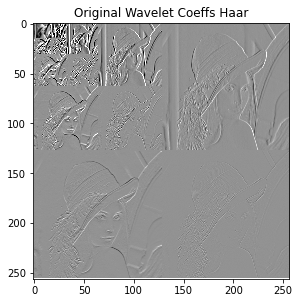

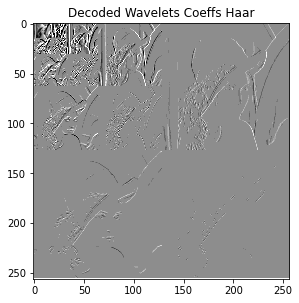

In [39]:
display_wavelet_dec(coeffs_haar,title='Original Wavelet Coeffs Haar')
display_wavelet_dec(coeffs_haar_rec,title='Decoded Wavelets Coeffs Haar')

Finally, one can synthesize an image from the decoded coefficients and compare the reconstructed image with the original and compute the peak signal to noise ratio between them.

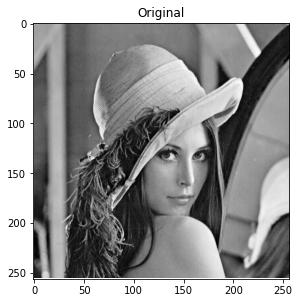

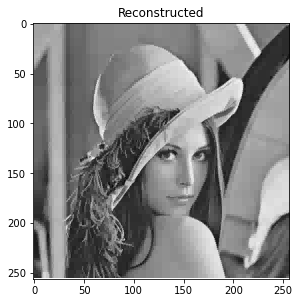

PSNR =  32.91761585912025 dB


In [40]:
imgm_rec = pywt.waverec2(coeffs_haar_rec, 'haar')
img_rec = imgm_rec + img_mean

display_image(img,size=1,title='Original')
display_image(img_rec,size=1,title='Reconstructed')

mse = np.mean(np.square(img - img_rec),axis=None)
psnr = -10*np.log10(mse)
print('PSNR = ', psnr, 'dB')


<font color='purple'>Q8. What kind of distortion can be observed? What is your assessment of this result?</font>

---
<font color='red'>Q8. Answer: 

We can see that the edges of the reconstructed image are a little bit blurry and there has been a loss of detail. It was obvious that it would happen as compression implies a loss of information.
Taking a look at the PSNR value,the reconstructed image is not exactly the same as the original one, but it is still a reasonable approximation (32.92 dB indicates that there is some loss of information during the compression and decompression process). Therefore, we can conclude that the compression has introduced some distortion but the quality of the reconstructed image is still acceptable.
</font> 

Let us reduce the bitstream by half and try to see the reconstructed image:


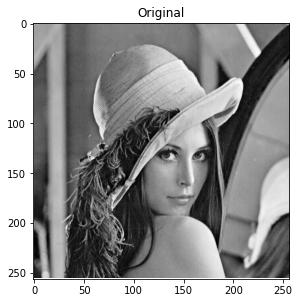

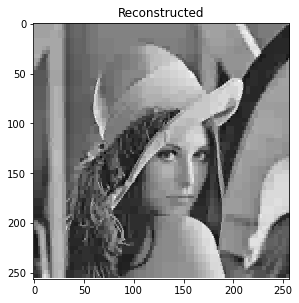

PSNR =  28.329950346458364 dB


In [41]:
bits_half = bits[0:bits.shape[0]//2]

wd_dec = spiht_decode(bits_half)
coeffs_haar_rec = pywt.array_to_coeffs(wd_dec, slices, output_format='wavedec2')

imgm_rec = pywt.waverec2(coeffs_haar_rec, 'haar')
img_rec = imgm_rec + img_mean

display_image(img,size=1,title='Original')
display_image(img_rec,size=1,title='Reconstructed')

mse = np.mean(np.square(img - img_rec),axis=None)
psnr = -10*np.log10(mse)
print('PSNR = ', psnr, 'dB')

Now choose the number of bit per pixel so that the distortion is almost not noticeable. Note that for high number of bits per pixels, as the bitstream is longer, the computational load will be also higher: 



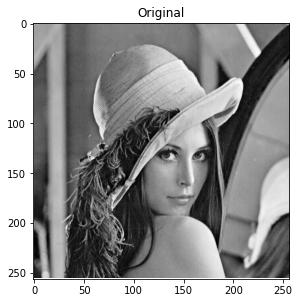

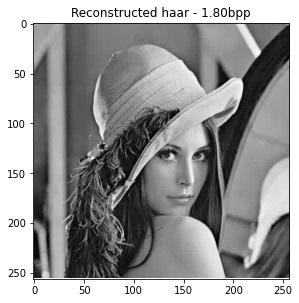

PSNR =  40.9226412949139 dB


In [42]:
# Wavelet decomposition
wname = 'haar'
coeffs = pywt.wavedec2(imgm, wname, level=level)
wd,slices = pywt.coeffs_to_array(coeffs)

# SPITH encode
bit_per_pixel = 1.8
max_bits = np.round(img.size*bit_per_pixel).astype(int)
bits = spiht_encode(wd, max_bits, level)

# SPITH decode
wd_dec = spiht_decode(bits)

# Wavelet reconstruction
coeffs_rec = pywt.array_to_coeffs(wd_dec, slices, output_format='wavedec2')
imgm_rec = pywt.waverec2(coeffs_rec, wname)
img_rec = imgm_rec + img_mean

# Display
display_image(img,size=1,title='Original')
display_image(img_rec,size=1,title='Reconstructed {0:s} - {1:0.2f}bpp'.format(wname,bit_per_pixel))
mse = np.mean(np.square(img - img_rec),axis=None)
psnr = -10*np.log10(mse)
print('PSNR = ', psnr, 'dB')

<font color='purple'>Q9. What is the limit of the number of bits per pixel for your image so that the distortion is almost not noticeable? What is the corresponding PSNR?</font>


---
<font color='red'>Q9. Answer: 
 After some trials, it seems that a value of 1.8 bits per pixel is enough to obtain a reconstructed image where the disortion is almost not noticeable at first sight from the original image.
I have noticed that a value of 1.5, the distortion is not that noticeable but some can be seen in the shoulder of Lena so I have decided to leave it in 1.8. 
The corresponding PSNR is around 40.92 dB.
</font> 

Perform now a decomposition with biorthogonal filters. Choose the number of bit per pixel so that the distortion is almost not noticeable: 

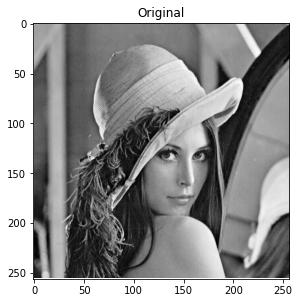

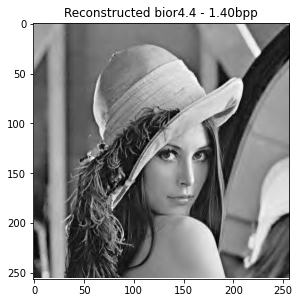

PSNR =  39.41211984734694 dB


In [43]:
# Wavelet decomposition
wname = 'bior4.4'
coeffs = pywt.wavedec2(imgm, wname,level=level)
wd,slices = pywt.coeffs_to_array(coeffs)

# SPITH encode
bit_per_pixel = 1.4 
max_bits = np.round(img.size*bit_per_pixel).astype(int)
bits = spiht_encode(wd, max_bits, level)

# SPITH decode
wd_dec = spiht_decode(bits)

# Wavelet reconstruction
coeffs_rec = pywt.array_to_coeffs(wd_dec, slices, output_format='wavedec2')
imgm_rec = pywt.waverec2(coeffs_rec, wname)
img_rec = imgm_rec + img_mean

# Display
display_image(img,size=1,title='Original')
display_image(img_rec,size=1,title='Reconstructed {0:s} - {1:0.2f}bpp'.format(wname,bit_per_pixel))
mse = np.mean(np.square(img - img_rec),axis=None)
psnr = -10*np.log10(mse)
print('PSNR = ', psnr, 'dB')

<font color='purple'>Q10. What is the limit of the number of bit per pixel for your image for the biorthogonal wavelet so that the distortion is almost not noticeable? What is the corresponding PSNR? Does it correspond to what you expected? </font>


---
<font color='red'>Q10. Answer: 
After running this code, we find that the limit of bit per pixel is around 1.4 bits per pixel, and the corresponding PSNR is around 39.41. This result is close to what we would expect, as biorthogonal wavelets are more effective at  keeping information in compression, so when the image is reconstructed, the loss of detail is smaller than the one with Haar. Therefore, for a similar reconstruction, we can observe that the biorthogonal wavelets needs less bits per pixels than the Haar ones. 
Let's see the value of the PSNR with the same value of bit per pixel of Haar:

</font> 

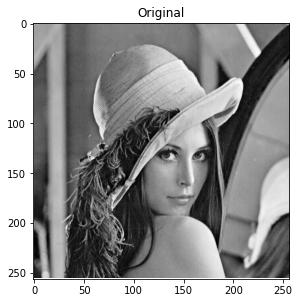

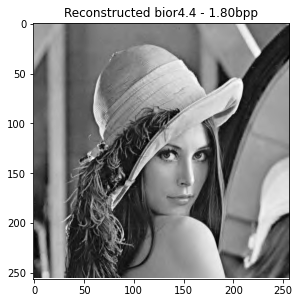

PSNR =  41.9760350646153 dB


In [44]:
# Wavelet decomposition
wname = 'bior4.4'
coeffs = pywt.wavedec2(imgm, wname,level=level)
wd,slices = pywt.coeffs_to_array(coeffs)

# SPITH encode
bit_per_pixel = 1.8
max_bits = np.round(img.size*bit_per_pixel).astype(int)
bits = spiht_encode(wd, max_bits, level)

# SPITH decode
wd_dec = spiht_decode(bits)

# Wavelet reconstruction
coeffs_rec = pywt.array_to_coeffs(wd_dec, slices, output_format='wavedec2')
imgm_rec = pywt.waverec2(coeffs_rec, wname)
img_rec = imgm_rec + img_mean

# Display
display_image(img,size=1,title='Original')
display_image(img_rec,size=1,title='Reconstructed {0:s} - {1:0.2f}bpp'.format(wname,bit_per_pixel))
mse = np.mean(np.square(img - img_rec),axis=None)
psnr = -10*np.log10(mse)
print('PSNR = ', psnr, 'dB')

<font color='red'>Q10. Answer: 
We can see a better reconstruction as the PSNR value is higher than the one obtained with the Haar coefficients, proving what we have said before.

</font> 

<font color='purple'>Q11. How would you describe the difference in terms of distortion between the compression done with Haar and with the biorthogonal wavelets?</font>


---
<font color='red'>Q11. Answer: 

As mentioned, biorthogonal wavelets perform better than Haar wavelets in compression at similar bit rates because they are more "flexible" (in general). This results in better image reconstruction and therefore a higher PSNR.
Since Haar wavelets are orthogonal and linear phase, they capture contours and parts of the image that are more horizontal and vertical better. On the other hand, biorthogonal wavelets allow for capturing more information (although they cannot capture vertical and horizontal contours or parts of the image as well as Haar wavelets because they are not orthogonal). For this reason, biorthogonal wavelets require fewer bits per pixel in compression than Haar wavelets for the distortion to not be visible in the reconstruction.
</font> 

In the following figure, the PSNR as a function of the number of bit per pixel for three filters (Haar, Daubechies of length 5 and biorthogonal) and a specific image has been computed.  




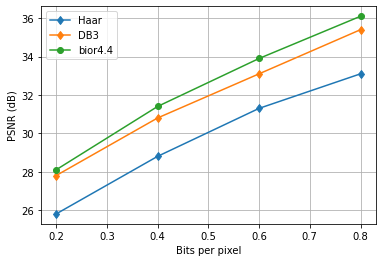

In [45]:
fig_haar = [25.8,28.8,31.3,33.1]
fig_db3 = [27.8,30.8,33.1,35.4]
fig_bior = [28.1,31.4,33.9,36.1]
bpp = [0.2,0.4,0.6,0.8]

plt.plot(bpp,fig_haar,'-d')
plt.plot(bpp,fig_db3,'-d')
plt.plot(bpp,fig_bior,'-o')
plt.legend(('Haar','DB3','bior4.4'))
plt.xlabel('Bits per pixel')
plt.ylabel('PSNR (dB)')
plt.grid()
plt.show()

<font color='purple'>Q12. What conclusions can be drawn from the figure?</font>


---
<font color='red'>Q12. Answer: 
The plot shows that the biorthogonal filter outperforms the other two filters for all bit per pixel values. At the starting point, the biorthogonal and the DB3 hae similar performance, but it seems that as we increase the bits per pixel values, they get separated. As for Haar filter, it has pretty bad performance in all cases compared to the othre two, as expected.

Although biorthogonal filter has a better performance, the computational time of Haar one is significantly smaller. We have seen that the reconstruction using the biorthogonal filter results in an image with less distortion, but the one reconstructed with Haar is also reasonable, so depending on the case, the Haar filter que suit us better.
</font> 

---
Congratulations. You have finished this laboratory. Save the notebook and upload it in Atenea.